In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import zipfile
import os
import cv2
import keras

from sklearn.model_selection import train_test_split

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input,Conv2D , MaxPooling2D, UpSampling2D,Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping

%matplotlib inline

In [ ]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/brammi/Brahmi_Mourya.png
/kaggle/input/brahmi/B K 091011 1933-34_1.png
/kaggle/input/imgtest2/1914 B 510 Ghhatradahalli 2_2.png
/kaggle/input/test22/Test2.png
/kaggle/input/testimage/Test.png
/kaggle/input/newimg/1914 B 510 Ghhatradahalli 2_1.png
/kaggle/input/brahmi-2-version/1914 B 510 Ghhatradahalli 2_1 (1).bmp
/kaggle/input/brahmi-anirudh/Image.jpeg
/kaggle/input/denoising-dirty-documents/train.zip
/kaggle/input/denoising-dirty-documents/sampleSubmission.csv.zip
/kaggle/input/denoising-dirty-documents/train_cleaned.zip
/kaggle/input/denoising-dirty-documents/test.zip


In [ ]:
path_zip='/kaggle/input/denoising-dirty-documents/'
path='/kaggle/working/'

In [ ]:
with zipfile.ZipFile(path_zip+'train.zip','r') as zip_ref:
    zip_ref.extractall(path)
with zipfile.ZipFile(path_zip+'test.zip','r') as zip_ref:
    zip_ref.extractall(path)
with zipfile.ZipFile(path_zip+'train_cleaned.zip','r') as zip_ref:
    zip_ref.extractall(path)
with zipfile.ZipFile(path_zip+'sampleSubmission.csv.zip','r') as zip_ref:
    zip_ref.extractall(path)


In [ ]:
train_img=sorted(os.listdir(path+'/train'))
train_cleaned_img=sorted(os.listdir(path+'/train_cleaned'))
test_img=sorted(os.listdir(path+'/test'))

In [ ]:
def process_image(path):
    img = cv2.imread(path)
    img = np.asarray(img, dtype = "float32")
    img = cv2.resize(img, (540, 420))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = img/255.0
    img = np.reshape(img, (420, 540, 1))

    return img

In [ ]:
train = []
train_cleaned = []
test = []

for f in sorted(os.listdir(path+'train/')):
    train.append(process_image(path+ 'train/'+f))

for f in sorted(os.listdir(path+'train_cleaned/')):
    train_cleaned.append(process_image(path+ 'train_cleaned/'+f))

for f in sorted(os.listdir(path+'test/')):
    test.append(process_image(path+ 'test/'+f))

In [ ]:
len(train_cleaned)

144

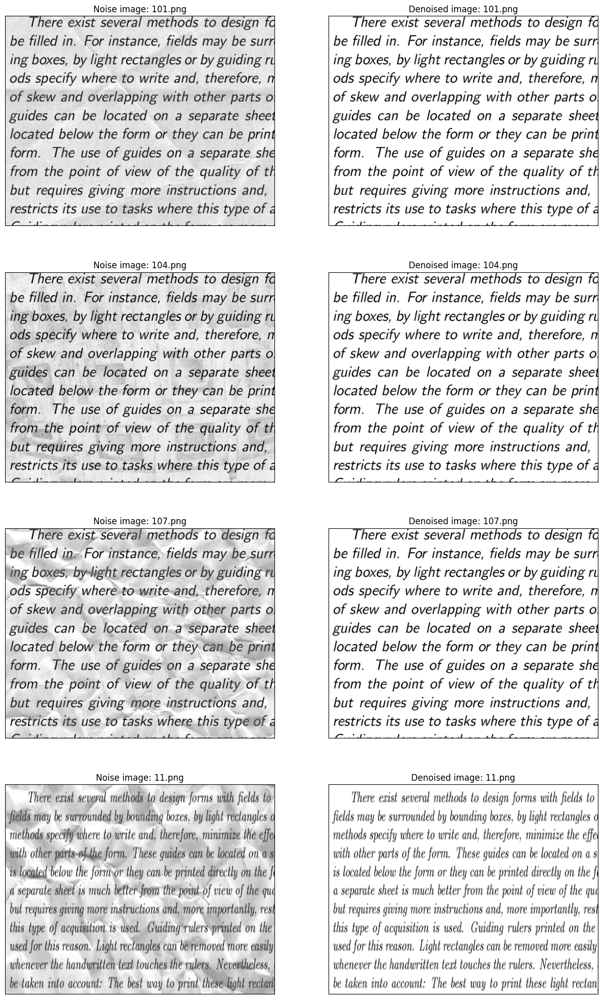

In [ ]:
plt.figure(figsize=(15,25))
for i in range(0,8,2):
    plt.subplot(4,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(train[i][:,:,0],cmap='gray')
    plt.title('Noise image: {}'.format(train_img[i]))

    plt.subplot(4,2,i+2)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(train_cleaned[i][:,:,0],cmap='gray')
    plt.title('Denoised image: {}'.format(train_img[i]))

plt.show()

In [ ]:
X_train =  np.asarray(train)
Y_train =  np.asarray(train_cleaned)
X_test = np.asarray(train)
X_train,X_val, Y_train,Y_val = train_test_split(X_train,Y_train,test_size=0.05)

In [ ]:
from keras import layers
import tensorflow as tf
import time
start_time = time.time()
def down(filters , kernel_size, apply_batch_normalization = True):
    downsample = tf.keras.models.Sequential()
    downsample.add(layers.Conv2D(filters,kernel_size,padding = 'same', strides = 2))
    if apply_batch_normalization:
        downsample.add(layers.BatchNormalization())
    downsample.add(keras.layers.LeakyReLU())
    return downsample


def up(filters, kernel_size, dropout = False):
    upsample = tf.keras.models.Sequential()
    upsample.add(layers.Conv2DTranspose(filters, kernel_size,padding = 'same', strides = 2))
    if dropout:
        upsample.add(layers.Dropout(0.2))
    upsample.add(keras.layers.LeakyReLU())
    return upsample


def model(height, width):
    inputs = keras.layers.Input(shape=(height, width, 1))
    d1 = down(64, (3, 3), False)(inputs)
    d2 = down(128, (3, 3), False)(d1)
    #d3 = down(128, (3, 3), False)(d2)
    #d4 = down(128, (3, 3), False)(d3)
    #d5 = down(128, (3, 3), False)(d4)
    #d6 = down(128, (3, 3), False)(d5)

    u1 = up(128, (3, 3), False)(d2)
    u2 = up(64, (3, 3), False)(u1)
    #u3 = up(128, (3, 3), False)(u2)
    #u4 = up(128, (3, 3), False)(u3)
    #u5 = up(128, (3, 3), False)(u4)
    #u6 = up(128, (3, 3), False)(u5)

    output = keras.layers.Conv2D(3, (3, 3), strides=1, padding='same')(u2)
    return keras.Model(inputs=inputs, outputs=output)

height = 420
width = 540
model = model(height, width)
model.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 420, 540, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential (Sequential)         │ (None, 210, 270, 64)   │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_1 (Sequential)       │ (None, 105, 135, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_2 (Sequential)       │ (None, 210, 270, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_3 (Sequential)       │ (None, 420, 540, 64)   │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 420, 540, 3)    │         1,731 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 297,603 (1.14 MB)

 Trainable params: 297,603 (1.14 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
import tensorflow as tf
EpochLoss=[]
def print_loss(epoch, logs):
    EpochLoss.append(logs['loss'])
print_loss_callback = tf.keras.callbacks.LambdaCallback(on_epoch_end=print_loss)

In [ ]:
model.compile(optimizer='adam', loss='mean_squared_error', metrics=['accuracy', 'mae', 'mse'])

history = model.fit(X_train, Y_train, epochs=30, batch_size=1, validation_data=(X_val, Y_val))

print(history)

loss_values = history.history['loss']
accuracy_values = history.history['accuracy']
mae_values = history.history['mae']
mse_values = history.history['mse']


Epoch 1/30
  6/136 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - accuracy: 0.1640 - loss: 0.6653 - mae: 0.7575 - mse: 0.6653

I0000 00:00:1714829009.985192     114 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


136/136 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - accuracy: 0.2054 - loss: 0.1576 - mae: 0.2813 - mse: 0.1576 - val_accuracy: 0.2439 - val_loss: 0.0273 - val_mae: 0.1228 - val_mse: 0.0273
Epoch 2/30
136/136 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - accuracy: 0.2140 - loss: 0.0234 - mae: 0.1077 - mse: 0.0234 - val_accuracy: 0.2050 - val_loss: 0.0105 - val_mae: 0.0753 - val_mse: 0.0105
Epoch 3/30
136/136 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - accuracy: 0.2100 - loss: 0.0105 - mae: 0.0733 - mse: 0.0105 - val_accuracy: 0.1709 - val_loss: 0.0065 - val_mae: 0.0556 - val_mse: 0.0065
Epoch 4/30
136/136 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - accuracy: 0.1892 - loss: 0.0063 - mae: 0.0561 - mse: 0.0063 - val_accuracy: 0.1593 - val_loss: 0.0050 - val_mae: 0.0535 - val_mse: 0.0050
Epoch 5/30
136/136 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - accuracy: 0.1748 - loss: 0.0046 - mae: 0.0474 - mse: 0.0046 - val_accuracy: 0.1486 - val_loss: 0.0033 - val_mae: 0.0379 - val_mse: 0.0033
Epoch 6/30
136/136 ━━━━━━━━━━━━━━━━━━━━ 3s 25

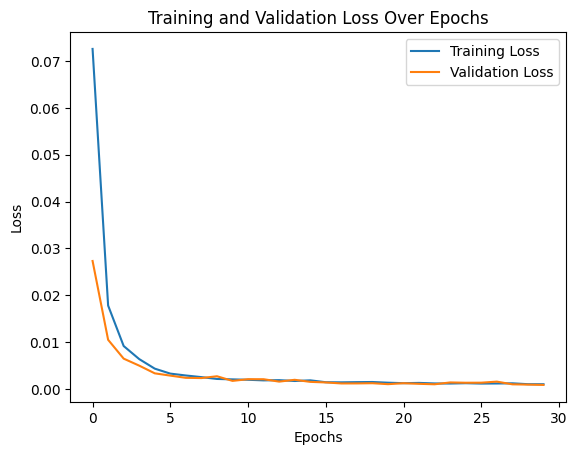

In [ ]:
import matplotlib.pyplot as plt

loss_values = a.history['loss']
val_loss_values = a.history['val_loss']

plt.figure()
plt.plot(loss_values, label='Training Loss')
plt.plot(val_loss_values, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.legend()
plt.show()


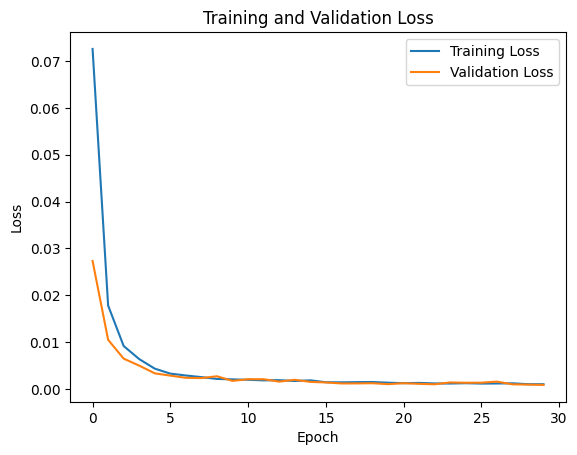

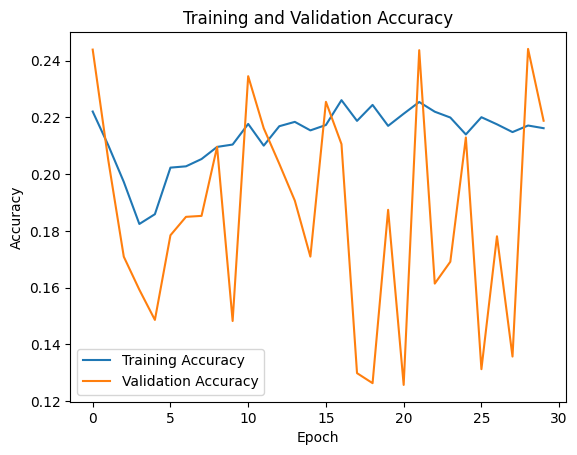

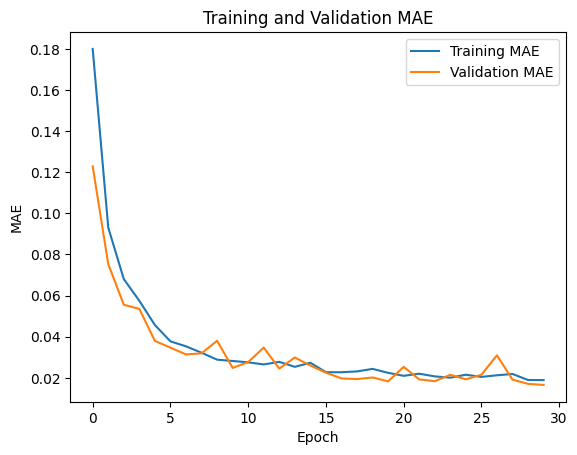

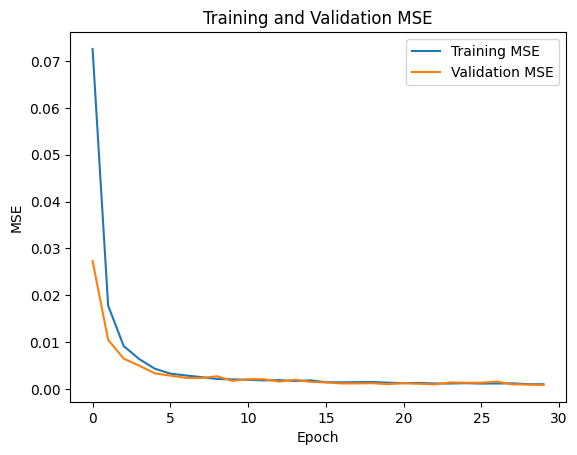

In [ ]:
import matplotlib.pyplot as plt

plt.figure()
plt.plot(loss_values, label='Training Loss')
plt.plot(a.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

plt.figure()
plt.plot(accuracy_values, label='Training Accuracy')
plt.plot(a.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

plt.figure()
plt.plot(mae_values, label='Training MAE')
plt.plot(a.history['val_mae'], label='Validation MAE')
plt.xlabel('Epoch')
plt.ylabel('MAE')
plt.title('Training and Validation MAE')
plt.legend()
plt.show()

plt.figure()
plt.plot(mse_values, label='Training MSE')
plt.plot(a.history['val_mse'], label='Validation MSE')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.title('Training and Validation MSE')
plt.legend()
plt.show()


0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


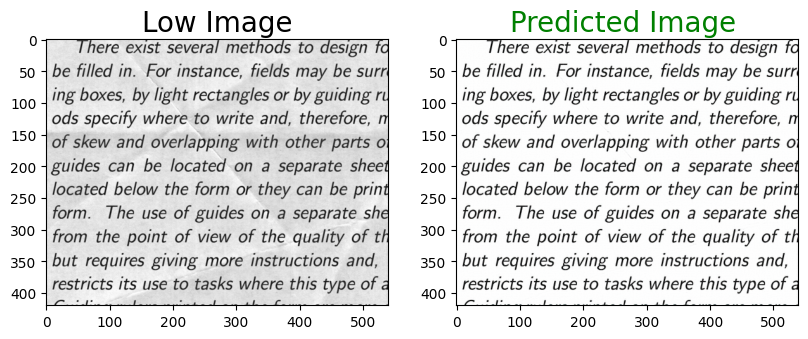

63
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


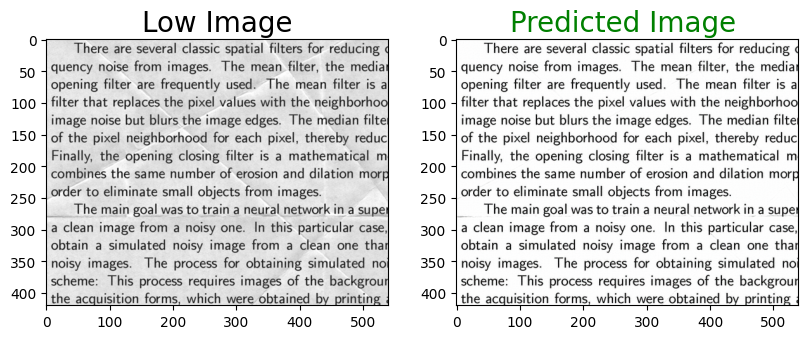

21
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


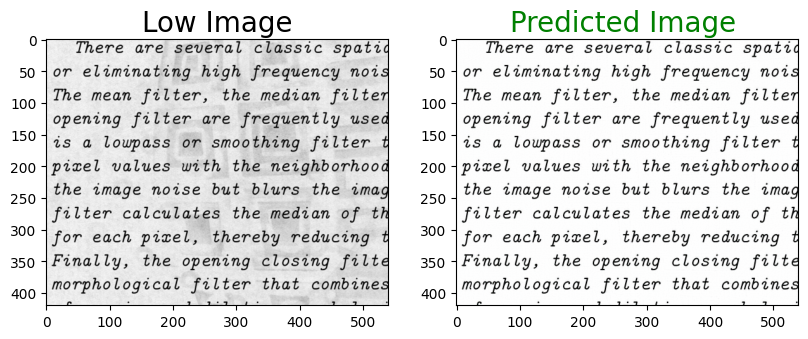

15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


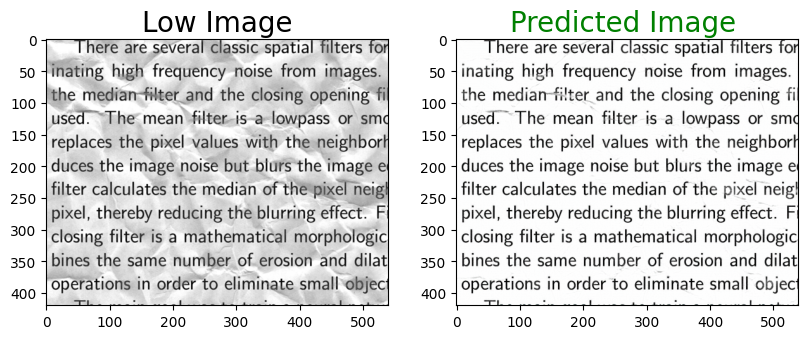

6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


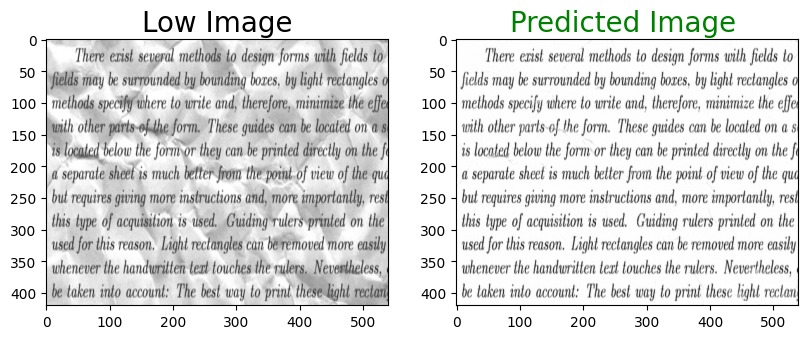

In [ ]:

def plot_images(high,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('Low Image', color = 'black', fontsize = 20)
    plt.imshow(high,cmap='gray')
    plt.subplot(1,3,2)
    plt.title('Predicted Image ', color = 'green', fontsize = 20)
    plt.imshow(predicted,cmap='gray')
    plt.show()

l=[]
for i in range(5):
    a = np.random.randint(0,73)
    print(a)
    predicted = np.clip(model.predict(X_test[a].reshape(1,420,540,1)),0.0,1.0).reshape(420, 540,3)
    l.append(predicted)
    plot_images(X_test[a],predicted)


94
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


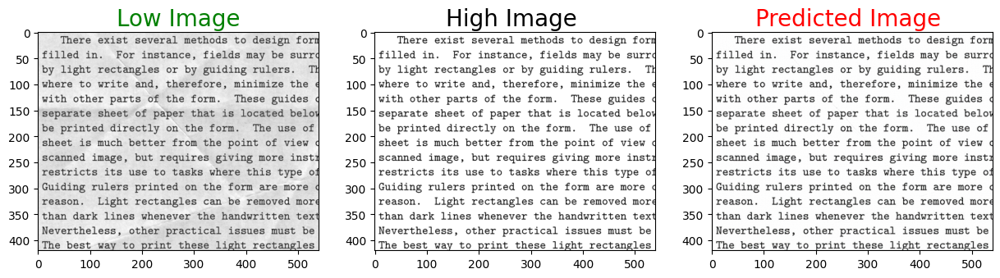

32
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


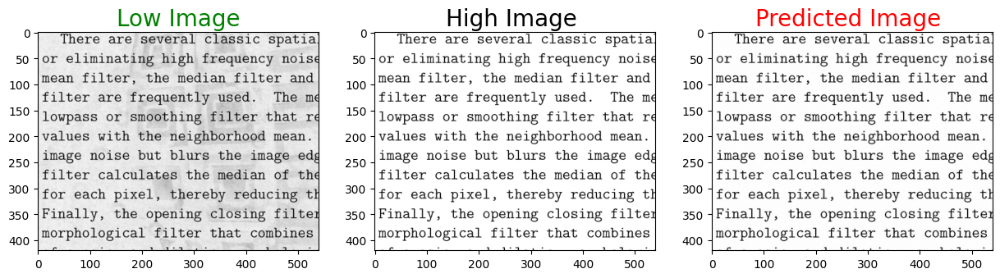

43
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


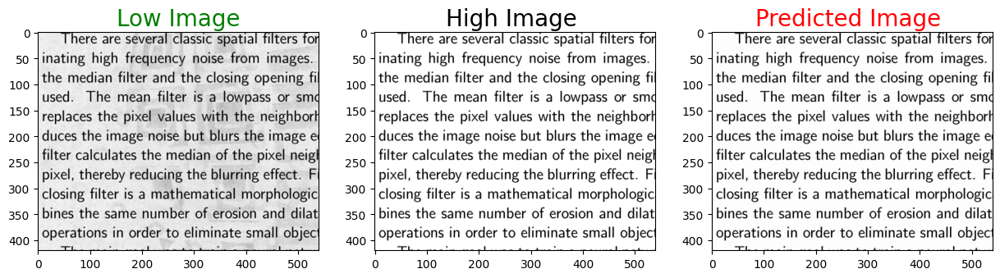

8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


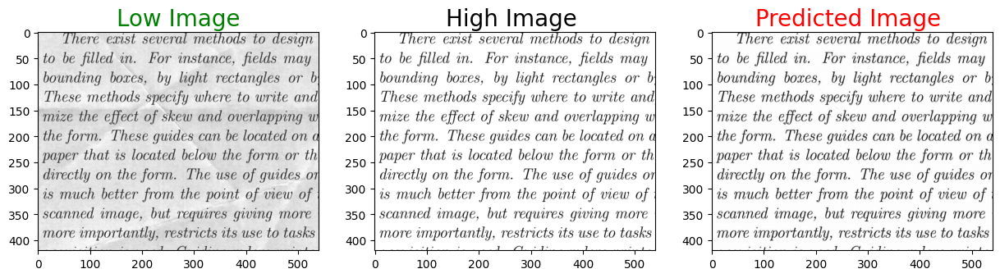

29
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


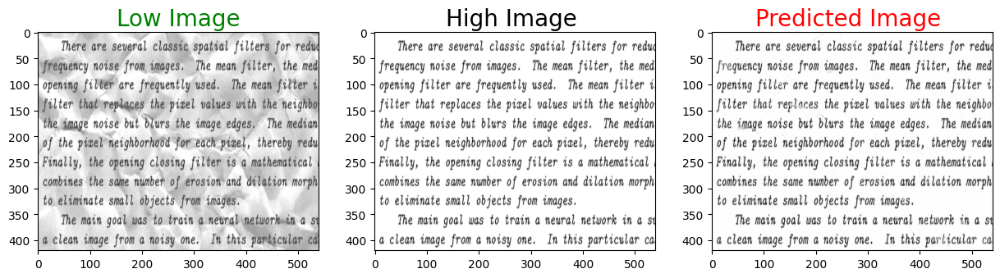

In [ ]:

def plot_images(high,low,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('Low Image', color = 'green', fontsize = 20)
    plt.imshow(high,cmap='gray')
    plt.subplot(1,3,2)
    plt.title('High Image ', color = 'black', fontsize = 20)
    plt.imshow(low,cmap='gray')
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted,cmap='gray')
    plt.show()

for i in range(5):
    a = np.random.randint(0,122)
    print(a)
    predicted = np.clip(model.predict(X_train[a].reshape(1,420,540,1)),0.0,1.0).reshape(420, 540,3)
    plot_images(X_train[a],Y_train[a],predicted)

In [ ]:
model.save("final_model1.h5")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step


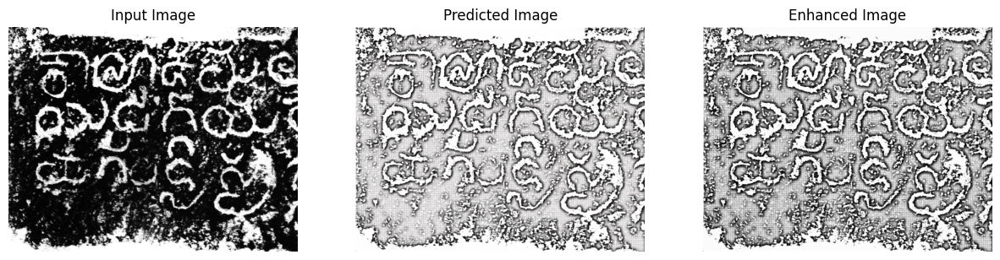

In [ ]:
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
from PIL import Image
import pytesseract

model = load_model('final_model1.h5')

def preprocess_image(image_path):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (540, 420))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = np.asarray(img, dtype='float32') / 255.0
    img = np.reshape(img, (420, 540, 1))
    return img

input_image_path = '/kaggle/input/brahmi-anirudh/Image.jpeg'
input_image = preprocess_image(input_image_path)

predicted_image = model.predict(input_image[np.newaxis, ...])
predicted_image = predicted_image.reshape(420, 540, 3)
predicted_image = np.clip(predicted_image, 0.0, 1.0)

predicted_image_gray = cv2.cvtColor((predicted_image * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)

clip_limit = 2.0
tile_grid_size = (8, 8)
clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)

enhanced_image = clahe.apply(predicted_image_gray)

enhanced_image_color = cv2.cvtColor(enhanced_image, cv2.COLOR_GRAY2RGB)

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(input_image.reshape(420, 540), cmap='gray')
plt.title('Input Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(predicted_image)
plt.title('Predicted Image')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(enhanced_image_color)
plt.title('Enhanced Image')
plt.axis('off')

plt.show()


In [ ]:
output_image_path = '/kaggle/working/predicted_image_gray.png'

cv2.imwrite(output_image_path, predicted_image_gray)

print(f"Enhanced image saved at {output_image_path}")



Enhanced image saved at /kaggle/working/predicted_image_gray.png


In [ ]:
output_image_path = '/kaggle/working/enhanced_image.png'

cv2.imwrite(output_image_path, enhanced_image_color)

print(f"Enhanced image saved at {output_image_path}")


Enhanced image saved at /kaggle/working/enhanced_image.png


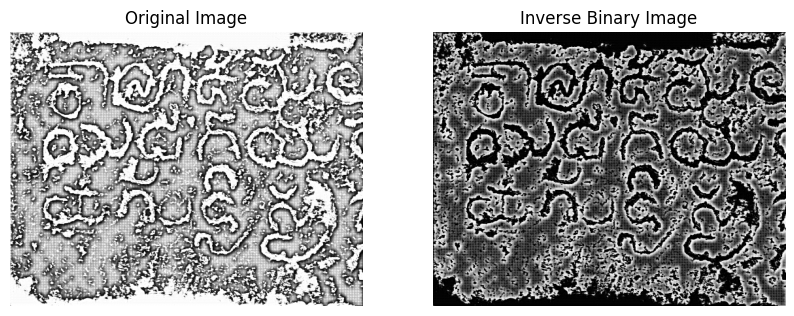

In [ ]:
import cv2
import matplotlib.pyplot as plt

inverse_binary_image = cv2.bitwise_not(enhanced_image_color)

enhanced_image_color_rgb = cv2.cvtColor(enhanced_image_color, cv2.COLOR_BGR2RGB)
inverse_binary_image_rgb = cv2.cvtColor(inverse_binary_image, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(enhanced_image_color_rgb)
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(inverse_binary_image_rgb)
axes[1].set_title('Inverse Binary Image')
axes[1].axis('off')

plt.show()


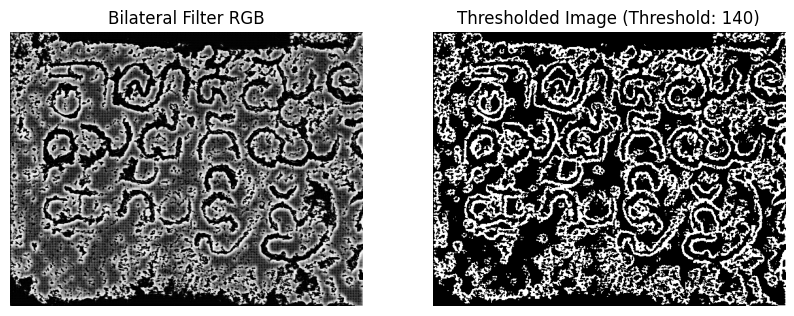

Enhanced image saved at /kaggle/working/thresholded_image.png


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

bilateral_filter_gray = cv2.cvtColor(inverse_binary_image_rgb, cv2.COLOR_RGB2GRAY)

threshold_value = 140

_, thresholded_image = cv2.threshold(bilateral_filter_gray, threshold_value, 255, cv2.THRESH_BINARY)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(inverse_binary_image_rgb)
axes[0].set_title('Bilateral Filter RGB')
axes[0].axis('off')

axes[1].imshow(thresholded_image, cmap='gray')
axes[1].set_title(f'Thresholded Image (Threshold: {threshold_value})')
axes[1].axis('off')

plt.show()

output_image_path = '/kaggle/working/thresholded_image.png'

cv2.imwrite(output_image_path, thresholded_image)

print(f"Enhanced image saved at {output_image_path}")


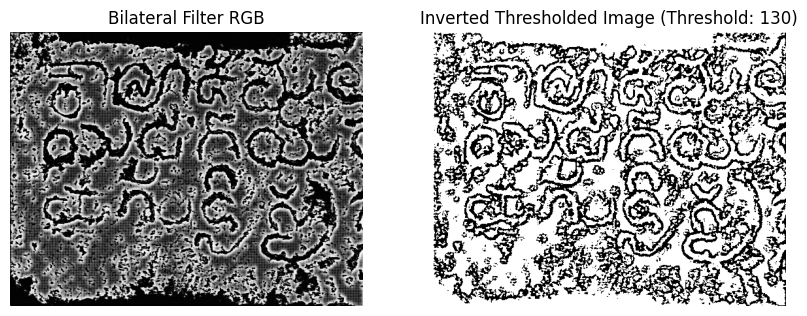

Inverted thresholded image saved at /kaggle/working/thresholded_image1.png
Enhanced image saved at /kaggle/working/thresholded_image1.png


In [ ]:
import cv2
import matplotlib.pyplot as plt

bilateral_filter_gray = cv2.cvtColor(inverse_binary_image_rgb, cv2.COLOR_RGB2GRAY)

threshold_value = 130

_, thresholded_image1 = cv2.threshold(bilateral_filter_gray, threshold_value, 255, cv2.THRESH_BINARY_INV)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(inverse_binary_image_rgb)
axes[0].set_title('Bilateral Filter RGB')
axes[0].axis('off')

axes[1].imshow(thresholded_image1, cmap='gray')
axes[1].set_title(f'Inverted Thresholded Image (Threshold: {threshold_value})')
axes[1].axis('off')

plt.show()

output_image_path = '/kaggle/working/thresholded_image1.png'

cv2.imwrite(output_image_path, thresholded_image1)

print(f"Inverted thresholded image saved at {output_image_path}")

output_image_path = '/kaggle/working/thresholded_image1.png'

cv2.imwrite(output_image_path, thresholded_image1)

print(f"Enhanced image saved at {output_image_path}")


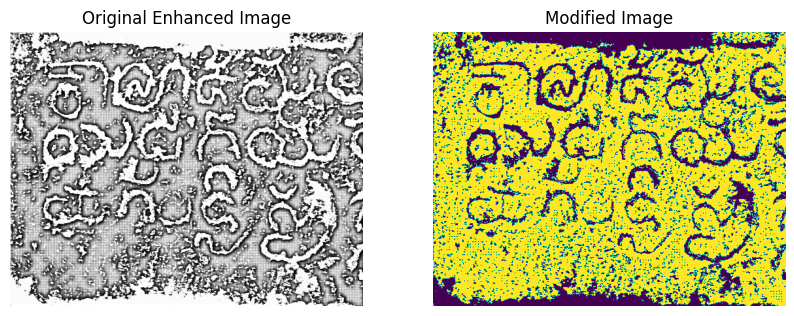

Modified image saved at /kaggle/working/modified_image.png


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

lower_white = np.array([240, 240, 240], dtype=enhanced_image.dtype)
upper_white = np.array([255, 255, 255], dtype=enhanced_image.dtype)

white_mask = cv2.inRange(enhanced_image_color, lower_white, upper_white)

inverted_mask = cv2.bitwise_not(white_mask)

white_image = np.full_like(enhanced_image, 255)

resulting_image = cv2.bitwise_and(white_image, white_image, mask=inverted_mask)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(cv2.cvtColor(enhanced_image, cv2.COLOR_BGR2RGB))
axes[0].set_title('Original Enhanced Image')
axes[0].axis('off')

axes[1].imshow(resulting_image)
axes[1].set_title('Modified Image')
axes[1].axis('off')

plt.show()

output_image_path = '/kaggle/working/modified_image.png'

cv2.imwrite(output_image_path, resulting_image)

print(f"Modified image saved at {output_image_path}")


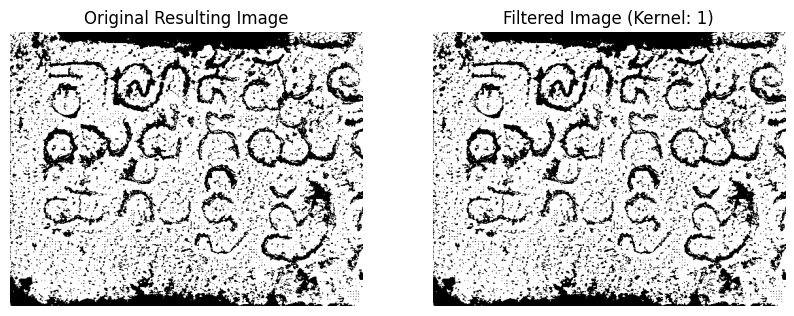

Filtered image saved at /kaggle/working/filtered_image.png


In [ ]:
import cv2
import matplotlib.pyplot as plt

kernel_size = 1

filtered_image = cv2.medianBlur(resulting_image, kernel_size)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(resulting_image, cmap='gray')
axes[0].set_title('Original Resulting Image')
axes[0].axis('off')

axes[1].imshow(filtered_image, cmap='gray')
axes[1].set_title(f'Filtered Image (Kernel: {kernel_size})')
axes[1].axis('off')

plt.show()

output_image_path = '/kaggle/working/filtered_image.png'

cv2.imwrite(output_image_path, filtered_image)

print(f"Filtered image saved at {output_image_path}")


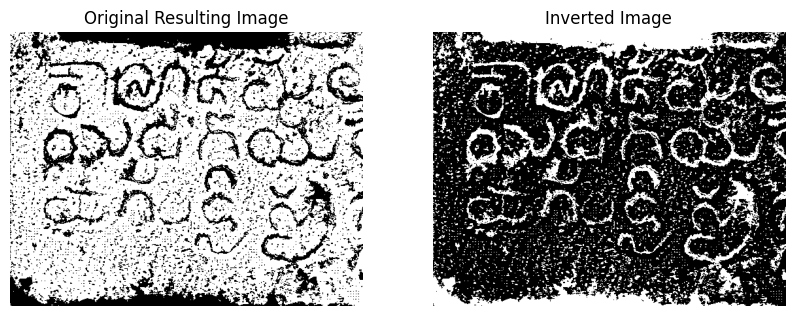

Inverted image saved at /kaggle/working/inverted_image.png


In [ ]:
import cv2
import matplotlib.pyplot as plt

inverted_image = cv2.bitwise_not(resulting_image)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(resulting_image, cmap='gray')
axes[0].set_title('Original Resulting Image')
axes[0].axis('off')

axes[1].imshow(inverted_image, cmap='gray')
axes[1].set_title('Inverted Image')
axes[1].axis('off')

plt.show()

output_image_path = '/kaggle/working/inverted_image.png'

cv2.imwrite(output_image_path, inverted_image)

print(f"Inverted image saved at {output_image_path}")

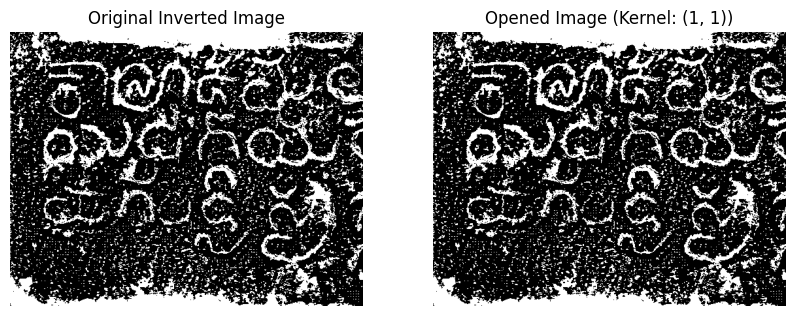

Opened image saved at /kaggle/working/opened_image.png


In [ ]:
import cv2
import matplotlib.pyplot as plt

kernel_size = (1, 1)
kernel_shape = cv2.MORPH_RECT
kernel = cv2.getStructuringElement(kernel_shape, kernel_size)

opened_image = cv2.morphologyEx(inverted_image, cv2.MORPH_OPEN, kernel)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(inverted_image, cmap='gray')
axes[0].set_title('Original Inverted Image')
axes[0].axis('off')

axes[1].imshow(opened_image, cmap='gray')
axes[1].set_title(f'Opened Image (Kernel: {kernel_size})')
axes[1].axis('off')

plt.show()

output_image_path = '/kaggle/working/opened_image.png'

cv2.imwrite(output_image_path, opened_image)

print(f"Opened image saved at {output_image_path}")


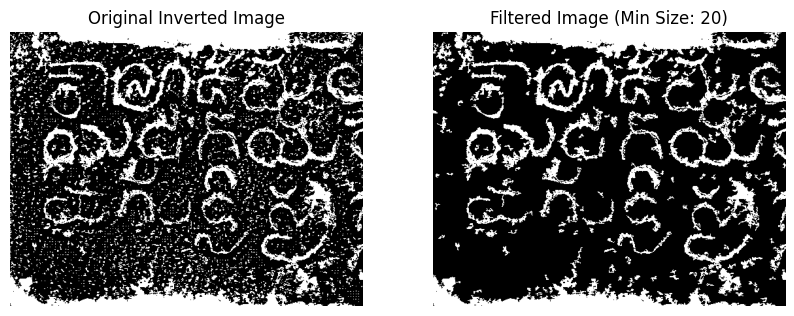

Filtered image saved at /kaggle/working/filtered_image.png


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(inverted_image, connectivity=8)

min_size = 20

filtered_image = inverted_image.copy()

for label in range(1, num_labels):
    size = stats[label, cv2.CC_STAT_AREA]
    if size < min_size:
        filtered_image[labels == label] = 0

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(inverted_image, cmap='gray')
axes[0].set_title('Original Inverted Image')
axes[0].axis('off')

axes[1].imshow(filtered_image, cmap='gray')
axes[1].set_title(f'Filtered Image (Min Size: {min_size})')
axes[1].axis('off')

plt.show()

output_image_path = '/kaggle/working/filtered_image.png'

cv2.imwrite(output_image_path, filtered_image)

print(f"Filtered image saved at {output_image_path}")

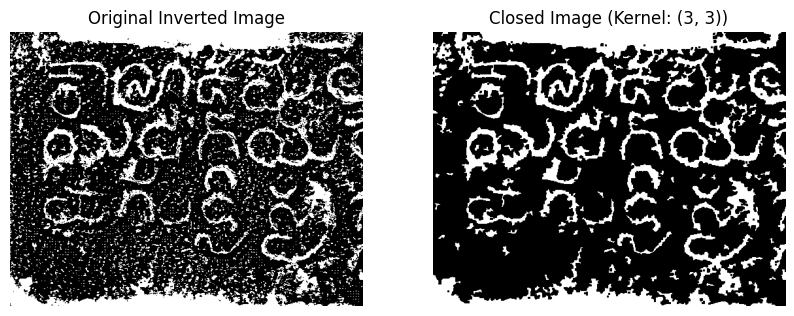

Closed image saved at /kaggle/working/closed_image.png


In [ ]:
import cv2
import matplotlib.pyplot as plt

kernel_size = (3, 3)
kernel_shape = cv2.MORPH_RECT
kernel = cv2.getStructuringElement(kernel_shape, kernel_size)

closed_image = cv2.morphologyEx(filtered_image, cv2.MORPH_CLOSE, kernel)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(inverted_image, cmap='gray')
axes[0].set_title('Original Inverted Image')
axes[0].axis('off')

axes[1].imshow(closed_image, cmap='gray')
axes[1].set_title(f'Closed Image (Kernel: {kernel_size})')
axes[1].axis('off')

plt.show()

output_image_path = '/kaggle/working/closed_image.png'

cv2.imwrite(output_image_path, closed_image)

print(f"Closed image saved at {output_image_path}")